In [2]:
import scipy.io as sio
import scipy.misc
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import os
import glob

In [27]:
d = sio.loadmat("/new_data/gpu/abhiagwl/Datasets/MPII/mpii_human_pose_v1_u12_2/mpii_human_pose_v1_u12_1.mat")

In [21]:
parts_list = ['head', 'leye', 'reye', 'lear', 'rear',
              'lebrow', 'rebrow', 'nose', 'mouth', 'hair',
              'torso', 'neck', 'llarm', 'luarm', 'lhand',
              'rlarm', 'ruarm', 'rhand', 'llleg', 'luleg',
              'lfoot', 'rlleg', 'ruleg', 'rfoot']
merged_parts_list = {'head': 1, 'leye': 1, 'reye': 1, 'lear': 1, 'rear': 1,
                     'lebrow': 1, 'rebrow': 1, 'nose': 1, 'mouth': 1, 'hair': 1,
                     'torso': 2, 'neck': 2,
                     'llarm': 4, 'luarm': 3, 'lhand': 4,
                     'rlarm': 4, 'ruarm': 3, 'rhand': 4,
                     'llleg': 6, 'luleg': 5, 'lfoot': 6,
                     'rlleg': 6, 'ruleg': 5, 'rfoot': 6}

In [28]:
anno = d["RELEASE"]
objects = d["RELEASE"][0,0][1]

In [22]:
object_name = [objects[0, i] for i in range(objects.shape[1])]

In [39]:
type(anno[0,0])

numpy.void

In [43]:
for i in anno[0,0]:
    print i.shape

(1, 24987)
(1, 24987)
(1,)
(24987, 1)
(24987, 1)
(1, 2821)


In [54]:
len([i for i in anno[0,0][0]])

1

In [152]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function
from __future__ import unicode_literals
from scipy.io import loadmat

import json
import numpy as np

In [171]:
def save_joints():
    joint_data_fn = '/new_data/gpu/abhiagwl/Datasets/MPII/data.json'
    mat = loadmat("/new_data/gpu/abhiagwl/Datasets/MPII/mpii_human_pose_v1_u12_2/mpii_human_pose_v1_u12_1.mat")

    fp = open(joint_data_fn, 'w')
    df = pd.DataFrame(columns=['filename','train','head_rect','is_visible','joint_pos'])
    iter_=0
    for i, (anno, train_flag) in enumerate(
        zip(mat['RELEASE']['annolist'][0, 0][0],
            mat['RELEASE']['img_train'][0, 0][0])):

        img_fn = anno['image']['name'][0, 0][0]
        train_flag = int(train_flag)

        if 'annopoints' in str(anno['annorect'].dtype):
            annopoints = anno['annorect']['annopoints'][0]
            head_x1s = anno['annorect']['x1'][0]
            head_y1s = anno['annorect']['y1'][0]
            head_x2s = anno['annorect']['x2'][0]
            head_y2s = anno['annorect']['y2'][0]
            for annopoint, head_x1, head_y1, head_x2, head_y2 in zip(
                    annopoints, head_x1s, head_y1s, head_x2s, head_y2s):
                if annopoint != []:
                    head_rect = [float(head_x1[0, 0]),
                                 float(head_y1[0, 0]),
                                 float(head_x2[0, 0]),
                                 float(head_y2[0, 0])]

                    # joint coordinates
                    annopoint = annopoint['point'][0, 0]
                    j_id = [str(j_i[0, 0]) for j_i in annopoint['id'][0]]
                    x = [x[0, 0] for x in annopoint['x'][0]]
                    y = [y[0, 0] for y in annopoint['y'][0]]
                    joint_pos = {}
                    for _j_id, (_x, _y) in zip(j_id, zip(x, y)):
                        joint_pos[str(_j_id)] = [float(_x), float(_y)]
                    # joint_pos = fix_wrong_joints(joint_pos)

                    # visiblity list
                    if 'is_visible' in str(annopoint.dtype):
                        vis = [v[0] if v else [0]
                               for v in annopoint['is_visible'][0]]
                        vis = dict([(k, int(v[0])) if len(v) > 0 else v
                                    for k, v in zip(j_id, vis)])
                    else:
                        vis = None

                    if len(joint_pos) == 16:
                        
                        data = {
                            'filename': img_fn,
                            'train': train_flag,
                            'head_rect': head_rect,
                            'is_visible': vis,
                            'joint_pos': joint_pos
                        }
                        df.loc[iter_]=data
                        iter_+=1
    return df



In [160]:
import pandas as pd
df = pd.DataFrame(columns=['filename','train','head_rect','is_visible','joint_pos'])

In [164]:

import pandas as pd
df = pd.DataFrame(columns=['lib', 'qty1', 'qty2'])
for i in range(5):
    df.loc[i] = {'lib':np.random.randint(-1,1), 'qty1':np.random.randint(-1,1), 'qty2':np.random.randint(-1,1) }

In [165]:
df

,lib,qty1,qty2
0,-1,0,0
1,-1,0,0
2,-1,0,-1
3,-1,0,0
4,0,-1,0


In [174]:
df = save_joints()

/users/gpu/ayushya/miniconda2/envs/ayushya/lib/python2.7/site-packages/ipykernel_launcher.py:23: FutureWarning: elementwise != comparison failed and returning scalar instead; this will raise an error or perform elementwise comparison in the future.


In [176]:
df.to_csv("/new_data/gpu/abhiagwl/Datasets/MPII/mpii_image.csv")

In [177]:
df.head()

,filename,train,head_rect,is_visible,joint_pos
0,015601864.jpg,1,"[627.0, 100.0, 706.0, 198.0]","{u'11': 1, u'10': 1, u'13': 1, u'12': 1, u'15'...","{u'11': [553.0, 161.0], u'10': [606.0, 217.0],..."
1,015601864.jpg,1,"[841.0, 145.0, 902.0, 228.0]","{u'11': 1, u'10': 1, u'13': 1, u'12': 0, u'15'...","{u'11': [883.0, 229.0], u'10': [871.0, 304.0],..."
2,005808361.jpg,1,"[914.0, 79.0, 1031.0, 237.0]","{u'11': 1, u'10': 1, u'13': 1, u'12': 1, u'15'...","{u'11': [798.0, 340.0], u'10': [869.0, 214.0],..."
3,005808361.jpg,1,"[427.0, 66.0, 549.0, 221.0]","{u'11': 1, u'10': 1, u'13': 1, u'12': 1, u'15'...","{u'11': [721.0, 386.0], u'10': [702.0, 267.0],..."
4,086617615.jpg,1,"[252.0, 187.0, 331.0, 266.0]","{u'11': 1, u'10': 1, u'13': 1, u'12': 1, u'15'...","{u'11': [260.0, 335.0], u'10': [328.0, 354.0],..."


In [187]:
image_file_list = sorted(df["filename"].value_counts().index.values)

In [199]:
df.head()

,filename,train,head_rect,is_visible,joint_pos
0,015601864.jpg,1,"[627.0, 100.0, 706.0, 198.0]","{u'11': 1, u'10': 1, u'13': 1, u'12': 1, u'15'...","{u'11': [553.0, 161.0], u'10': [606.0, 217.0],..."
1,015601864.jpg,1,"[841.0, 145.0, 902.0, 228.0]","{u'11': 1, u'10': 1, u'13': 1, u'12': 0, u'15'...","{u'11': [883.0, 229.0], u'10': [871.0, 304.0],..."
2,005808361.jpg,1,"[914.0, 79.0, 1031.0, 237.0]","{u'11': 1, u'10': 1, u'13': 1, u'12': 1, u'15'...","{u'11': [798.0, 340.0], u'10': [869.0, 214.0],..."
3,005808361.jpg,1,"[427.0, 66.0, 549.0, 221.0]","{u'11': 1, u'10': 1, u'13': 1, u'12': 1, u'15'...","{u'11': [721.0, 386.0], u'10': [702.0, 267.0],..."
4,086617615.jpg,1,"[252.0, 187.0, 331.0, 266.0]","{u'11': 1, u'10': 1, u'13': 1, u'12': 1, u'15'...","{u'11': [260.0, 335.0], u'10': [328.0, 354.0],..."


In [200]:
df[df["filename"]==image_file_list[1]]

,filename,train,head_rect,is_visible,joint_pos
2965,000003072.jpg,1,"[722.0, 130.0, 763.0, 200.0]","{u'11': 1, u'10': 1, u'13': 1, u'12': 1, u'15'...","{u'11': [684.0, 276.0], u'10': [639.0, 302.0],..."
2966,000003072.jpg,1,"[429.0, 79.0, 491.0, 165.0]","{u'11': 1, u'10': 1, u'13': 1, u'12': 1, u'15'...","{u'11': [367.0, 261.0], u'10': [437.0, 261.0],..."


In [201]:
for i in image_file_list:
#     print (i)
    person = df[df["filename"]==i]
        print (person.head())
#         dict1 = person["is_visible"]
#         dict2 = person["joint_pos"]
#         print (dict1,dict2)
    break

AttributeError: 'unicode' object has no attribute 'head'

In [132]:
anno_list = anno[0,0][0][0]
train_list = anno[0,0][1]
# single_list = anno[0,0][2]
single_list = anno[0,0][3]
action_list = anno[0,0][4]

for i in anno_list[100][1][0,0]:
    print i

[[184]]
[[18]]
[[279]]
[[139]]
[[ (array([[ (array([[155]], dtype=uint8), array([[430]], dtype=uint16), array([[6]], dtype=uint8), array([[0]], dtype=uint8)),
        (array([[180]], dtype=uint8), array([[153]], dtype=uint8), array([[7]], dtype=uint8), array([[0]], dtype=uint8)),
        (array([[ 196.509]]), array([[ 129.1181]]), array([[8]], dtype=uint8), array([], shape=(0, 0), dtype=uint8)),
        (array([[ 266.491]]), array([[ 27.8819]]), array([[9]], dtype=uint8), array([], shape=(0, 0), dtype=uint8)),
        (array([[288]], dtype=uint16), array([[688]], dtype=uint16), array([[0]], dtype=uint8), array([[1]], dtype=uint8)),
        (array([[274]], dtype=uint16), array([[555]], dtype=uint16), array([[1]], dtype=uint8), array([[1]], dtype=uint8)),
        (array([[181]], dtype=uint8), array([[430]], dtype=uint16), array([[2]], dtype=uint8), array([[1]], dtype=uint8)),
        (array([[129]], dtype=uint8), array([[429]], dtype=uint16), array([[3]], dtype=uint8), array([[0]], dtype

In [22]:
def make_mask(matfile):
    flag = 0
    d = sio.loadmat(matfile)
    if "image" in matfile:
        parts_mask = np.transpose(np.expand_dims(d["M"], 0), (1, 2, 0))
    else:
        objects = d["anno"][0, 0][1]
        object_name = [objects[0, i][0][0] for i in range(objects.shape[1])]
        img_shape = objects[0, 0][2].shape
        parts_mask = np.zeros(img_shape + (1, ))
        for index, obj in enumerate(object_name):
            if obj == "person":
                flag = 1
                if not objects[0, index][3].shape == (0, 0):
                    for j in range(objects[0, index][3].shape[1]):
                        parts_mask[:, :, 0] = np.where(parts_mask[:, :, 0] == 0, merged_parts_list[objects[0, index][3][0, j][0][0]] * np.array(objects[0, index][3][0, j][1]), parts_mask[:, :, 0])
    return parts_mask, flag

In [24]:
if not os.path.exists('/extra_data/ayushya/VOCdevkit/VOC2010/Seg_Parts/'):
    os.mkdir('/extra_data/ayushya/VOCdevkit/VOC2010/Seg_Parts')
count = 0
for matfile in glob.glob('/extra_data/ayushya/VOCdevkit/VOC2010/Annotations_Part/*.mat'):
    name = matfile.split("/")[-1].split(".")[-2]
    pmask, flag = make_mask(matfile)
    if flag:
        count+=1
        scipy.misc.imsave('/extra_data/ayushya/VOCdevkit/VOC2010/Seg_Parts/'+name+'.png', pmask[:,:,0])

In [25]:
count

3589

(375, 500, 1)


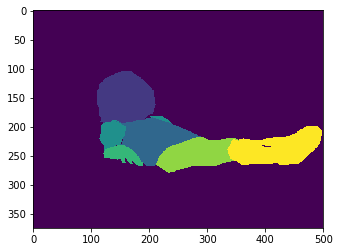

In [13]:
print(pmask.shape)
plt.imshow(pmask[:,:,0])
plt.show()

In [ ]:
for matfile in glob.glob('/new_data/gpu/abhiagwl/Datasets/MPII/'):
    name = matfile.split("/")[-1].split(".")[-2]
    

In [55]:
from __future__ import division, print_function, unicode_literals
import numpy as np
import argparse
import os
import os.path as osp
import tqdm
import torch
import math
import torch.utils.data
import torchvision.models as models
import torchvision.transforms as transforms
import glob
import torchvision
import PIL.Image
from torch.autograd import Variable
import torch.nn.functional as F
import collections
import torch.nn as nn
import scipy.misc
import scipy.io as sio
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

In [147]:
 def genmat(path,image):
        H,W,_ = image.shape
        # Hn = np.ceil(H/8).astype(np.int64)
        # Wn = np.ceil(W/8).astype(np.int64)
        mat = scipy.io.loadmat(path)
        limbs = [[0,1],[1,2],[2,3],[3,4],[1,5],[5,6],[6,7],[1,8],[8,9],[9,10],[1,11],[11,12],[12,13]]
        out = np.zeros((14,H,W))
        paf = np.zeros((26,H,W))
        x, y = np.meshgrid(np.arange(W), np.arange(H))
        for human in mat['joints'][0]:
            poselist = np.around(human[:,:-1]).astype(np.int64)
            # poselist[:,0] = poselist[:,0]*Hn/H
            # poselist[:,1] = poselist[:,1]*Wn/W
            vis = human[:,2]
            #PAF GT
            for (i,limb) in enumerate(limbs):
                p1 = poselist[limb[0],:]
                p2 = poselist[limb[1],:]
                if (p1[0]==p2[0] and p1[1]==p2[1]):
                    continue
                dvec = (p2-p1)/np.linalg.norm(p2-p1)
                if not (vis[limb[0]]==0 or vis[limb[1]]==0):
    #             if (np.all(p1>0) and np.all(p2>0)):
                    #APPROX RECON
                    vecx = x - p1[0]
                    vecy = y - p1[1]
                    dot = vecx*dvec[0] + vecy*dvec[1]
                    perp2 = vecx**2+vecy**2-dot**2
                    boolmat = (dot>0) & (dot<np.linalg.norm(p2-p1)) & (perp2<np.linalg.norm(p2-p1)*0.2) #sigma^2
                    paf[2*i][boolmat] = dvec[0]
                    paf[2*i+1][boolmat] = dvec[1]
#                     print(dvec)
            #POSE GT
#             print(human)
            for (i,pose) in enumerate(poselist):
#                 print(pose)
                if not (vis[i]==0):
                    tmp = np.exp(-((x-pose[0])**2 + (y-pose[1])**2)/(2.0*10.0))
                    out[i] = np.maximum(out[i],tmp)
        return out,paf

In [151]:
test_par = 0.01
root = '/extra_data/ayushya'
files = collections.defaultdict(list)

for split in ['train', 'val']:
            imgsets_file = osp.join(root,'pascal_data/pascal_data/%s_idnew.txt' % split)
            np.random.seed(2)
            img_id_list = [did.strip() for did in open(imgsets_file)]
            np.random.shuffle(img_id_list)
            img_id_list = img_id_list[:np.ceil(test_par*len(img_id_list)).astype(np.int32)]
            for did in img_id_list:
                img_file = osp.join(root, 'VOCdevkit/VOC2010/JPEGImages/%s.jpg' % did)
                lbl_file = osp.join(root, 'pascal_data/pascal_data/PersonJoints/%s.mat' % did)
                files[split].append({
                    'img': img_file,
                    'lbl': lbl_file,
                })

In [152]:
max_value = 16581375 #255**3
interval = int(max_value / 14)
colors = [hex(I)[2:].zfill(6) for I in range(0, max_value, interval)]

cmap = [(int(i[:2], 16), int(i[2:4], 16), int(i[4:], 16)) for i in colors]
cmap2 = [(int(i[:2],16)/255, int(i[2:4],16)/255, int(i[4:],16)/255) for i in colors]
handles = [
    Rectangle((0,0),1,1, color = c) for c in cmap2
]
# labels = ['head',
#         'neck',
#         'rshoul',
#         'relb',
#         'rwrist',
#         'lshou',
#         'lelbow',
#         'lwrist',
#         'rhip',
#         'rknee',
#         'rankle',
#         'lhip',
#         'lknee',
#         'lankle']
labels = ['head',
        'neck',
        'lshou',
        'lelbow',
        'lwrist',
        'lhip',
        'lknee',
        'lankle',
        'rshoul',
        'relb',
        'rwrist',
        'rhip',
        'rknee',
        'rankle',]

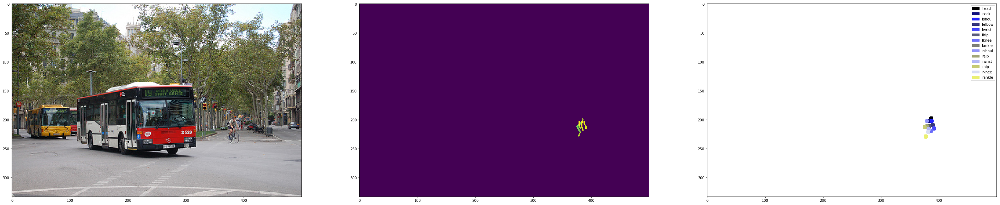

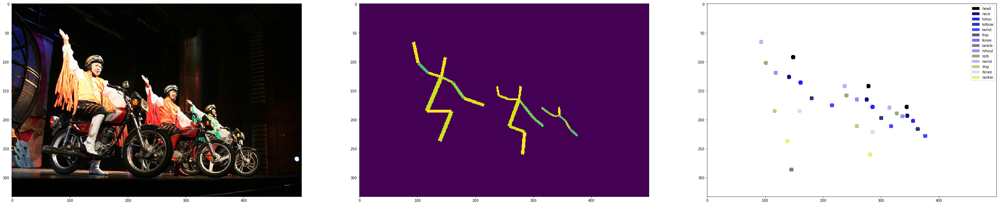

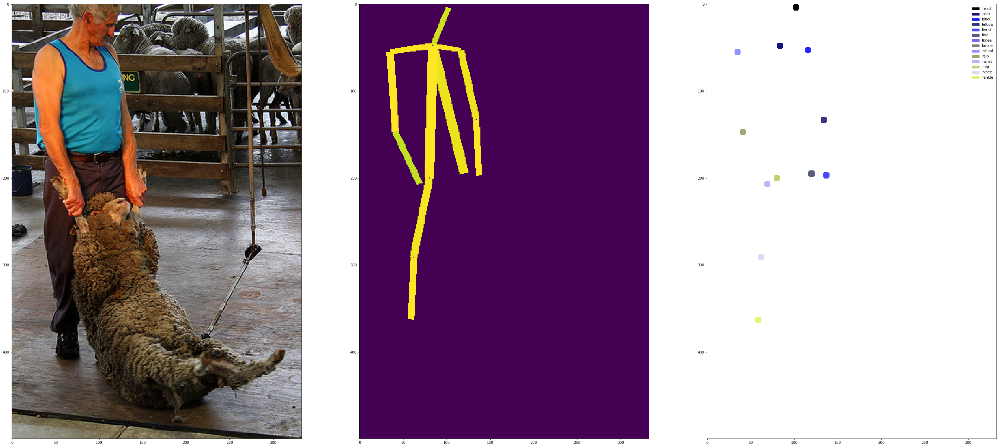

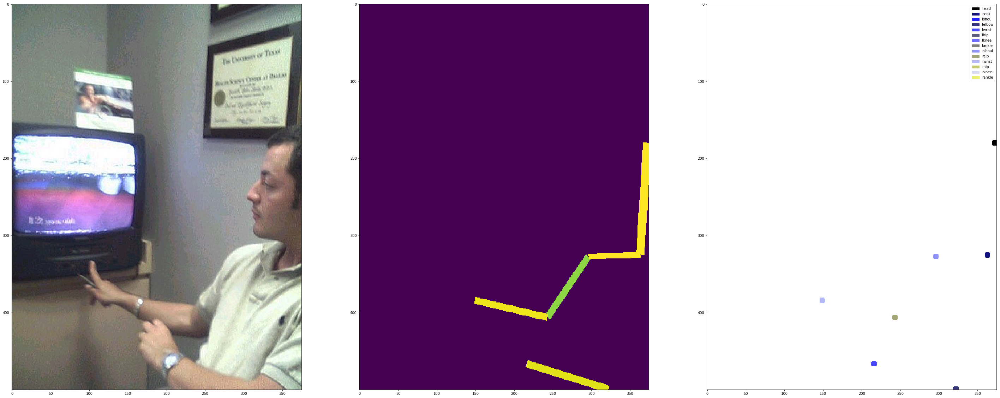

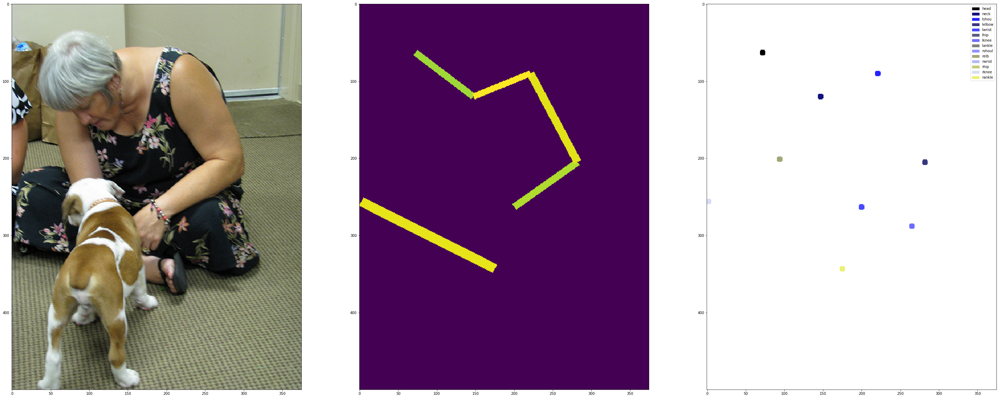

...

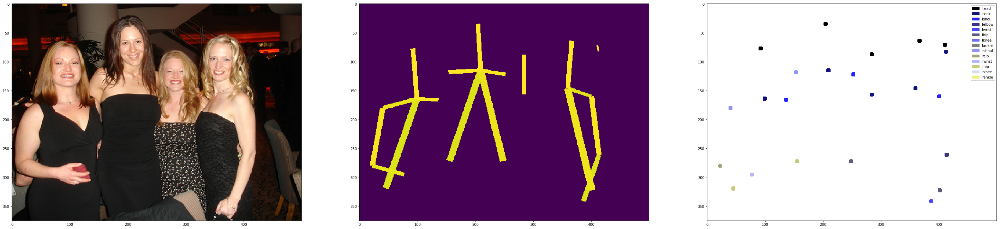

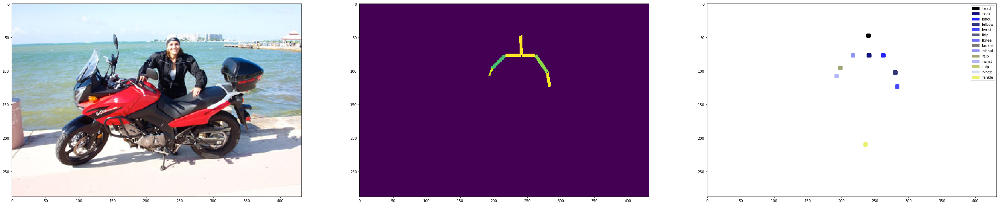

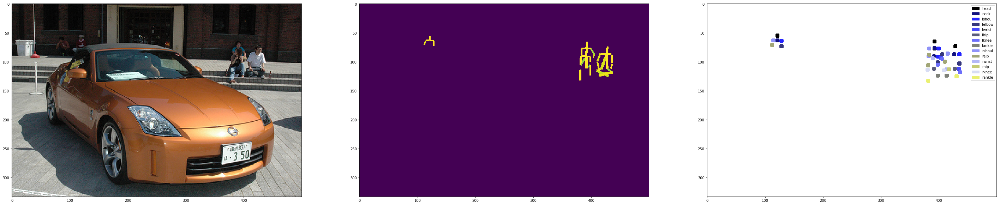

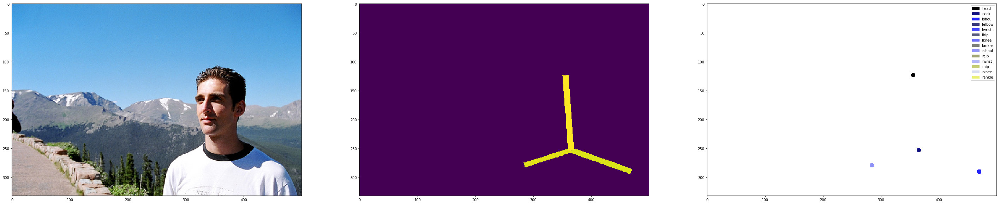

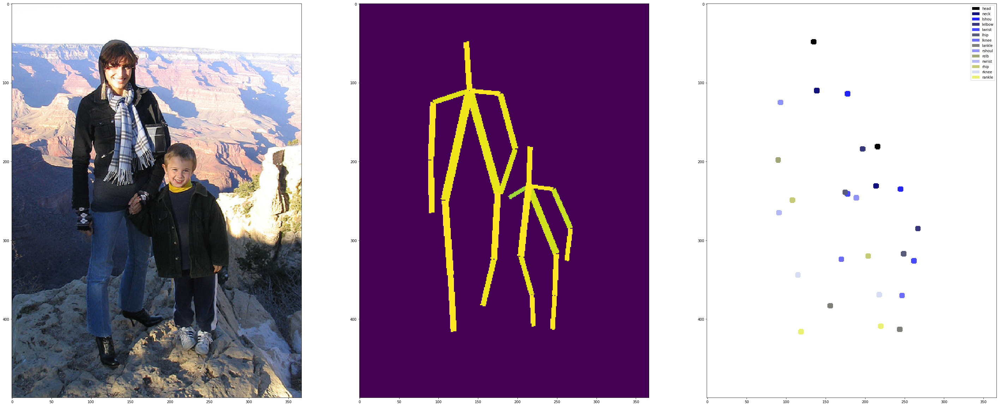

In [153]:
for ifile in files['train']:
    segment = PIL.Image.open(ifile['img'])
    # print(segment.size)
    segment = np.array(segment,dtype=np.uint8)
    # print(segment.shape)
    out,paf = genmat(ifile['lbl'],segment)
    tmp = np.ones((out.shape[1],out.shape[2],3))
    for i in range(len(out)):
        tmp[out[i]>0.5] = cmap2[i] 
    plt.figure(figsize=(50,50))
    plt.subplot(1,3,1)
    plt.imshow(segment)
    plt.subplot(1,3,2)
    plt.imshow(np.abs(paf).max(axis=0))
#     plt.imshow(out[:8].max(axis=0))
    plt.subplot(1,3,3)
    plt.imshow(tmp)
    plt.legend(handles,labels)
    plt.show()

In [8]:
# DEMO
segment = PIL.Image.open('/extra_data/ayushya/VOCdevkit/VOC2010/JPEGImages/2009_000544.jpg')
# print(segment.size)
segment = np.array(segment,dtype=np.uint8)
# print(segment.shape)
out,paf = genmat('/extra_data/ayushya/pascal_data/pascal_data/PersonJoints/2009_000544.mat',segment)
# print(paf.shape)
# print(out.shape)

(26, 500, 375)
(14, 500, 375)


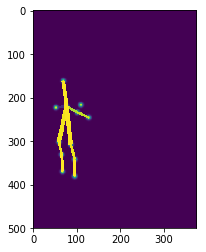

In [16]:
plt.imshow(np.vstack([paf,out]).max(axis=0))
plt.show()